<a href="https://colab.research.google.com/github/SebastianGomezViggiano/Computer-Vision/blob/main/Exercise_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1: IMAGE PREPROCESSING

Module 1: Image Preprocessing
Christian Mata, PhD

# Exercise 1

**Before starting:**

- Create a GitHub repository to upload the solution of this exercise.
- Share this GitHub link to your professor.

**Objectives**

Generate a single Python notebook implementing and answering the following questions:

**- Task 1:** Load the built-in image 'coffee' of the skimage libraries. Details can be found at https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html#sphx-glr-auto-examples-data-plot-general-py

**- Task 2:** Use the skimage function random_noise to add each of the 7 different types of noise available and generate a 4x2 panel figure with the original image and the 7 corrupted versions. The noise types are:

* ‘gaussian’ Gaussian-distributed additive noise.
* ‘localvar’ Gaussian-distributed additive noise, with specified
local variance at each point of image.
* ‘poisson’ Poisson-distributed noise generated from the data.
* ‘salt’ Replaces random pixels with 1.
* ‘pepper’ Replaces random pixels with 0 (for unsigned images) or
-1 (for signed images).
* ‘s&p’ Replaces random pixels with either 1 or low_val, where
low_val is 0 for unsigned images or -1 for signed images.
* ‘speckle’ Multiplicative noise using out = image + n*image, where
n is Gaussian noise with specified mean & variance.

Documentation of the function can be found at
https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.random_noise

**- Task 3:** Select one of the noise types and generate 3 noisy images with different noise intensity levels. Represent the original image along with them in a 2x2 figure.

**- Task 4: **The standard deviation for Gaussian kernel affects the behavior of the gaussian filter (parameter sigma, see documentation https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.gaussian). Explore the effect of the parameter sigma when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.

**- Task 5:** Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter. Quantify what is the fraction of the image corresponding to bricks and to edges.

**- Task 6:** Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.

**- Task 7:** Use the function binary_blobs to generate an image with random blobs: https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.binary_blobs
How many consecutive morphological erosions are needed in order to remove all the blobs? Use a disk-shaped structuring element of radius 3 pixels (footprint). https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk




In [ ]:
#Task 1: Load the built-in image 'coffee' of the skimage librarie

import matplotlib.pyplot as plt
import matplotlib
import numpy as np

from skimage import data

matplotlib.rcParams['font.size'] = 18

images = (
    'astronaut',
    'binary_blobs',
    'brick',
    'colorwheel',
    'camera',
    'cat',
    'checkerboard',
    'clock',
    'coffee',
    'coins',
    'eagle',
    'grass',
    'gravel',
    'horse',
    'logo',
    'page',
    'text',
    'rocket',
)

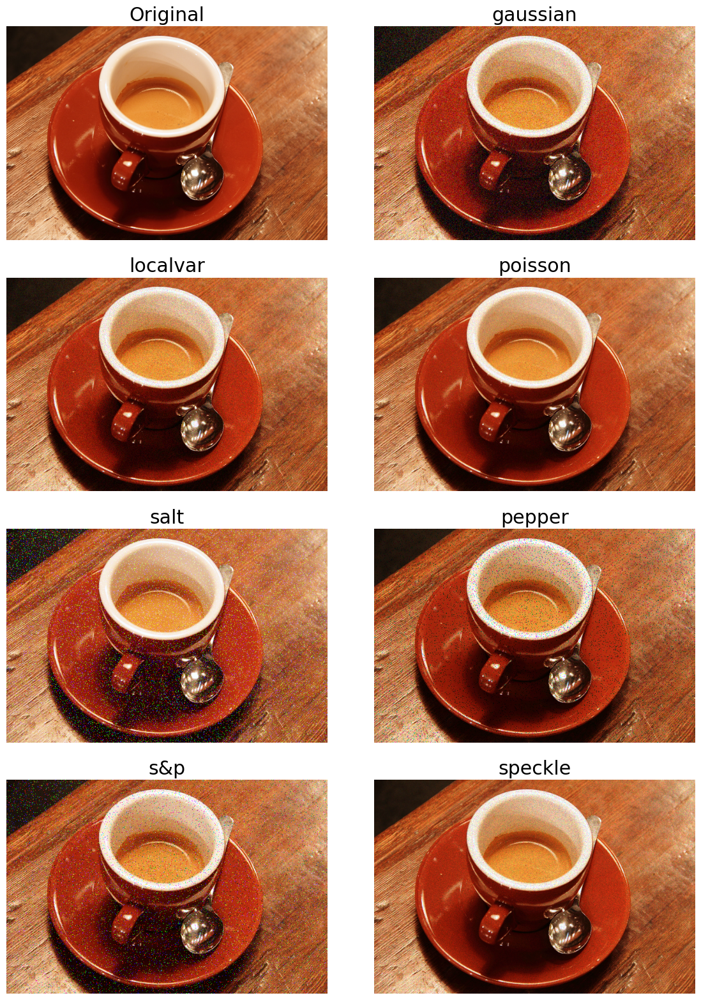

In [ ]:
# Task 2: Use the skimage function random_noise to add each of the 7 different types of noise available.

import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise

# Load coffee image and convert to float [0,1]
original = img_as_float(data.coffee())

# The seven noise modes
noise_modes = [
    'gaussian', 'localvar', 'poisson',
    'salt', 'pepper', 's&p', 'speckle'
]

# Create 4×2 figure
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes = axes.ravel()

# Plot original
axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

# Generate and plot each noisy version
for ax, mode in zip(axes[1:], noise_modes):
    if mode == 'localvar':
        # Ensure all values > 0
        local_vars = 0.01 * original + 1e-4  # offset to avoid 0
        noisy = random_noise(original, mode=mode, local_vars=local_vars)
    else:
        noisy = random_noise(original, mode=mode)
    ax.imshow(noisy)
    ax.set_title(mode)
    ax.axis('off')

plt.tight_layout()
plt.savefig('coffee_all_noises.png', dpi=150)
plt.show()


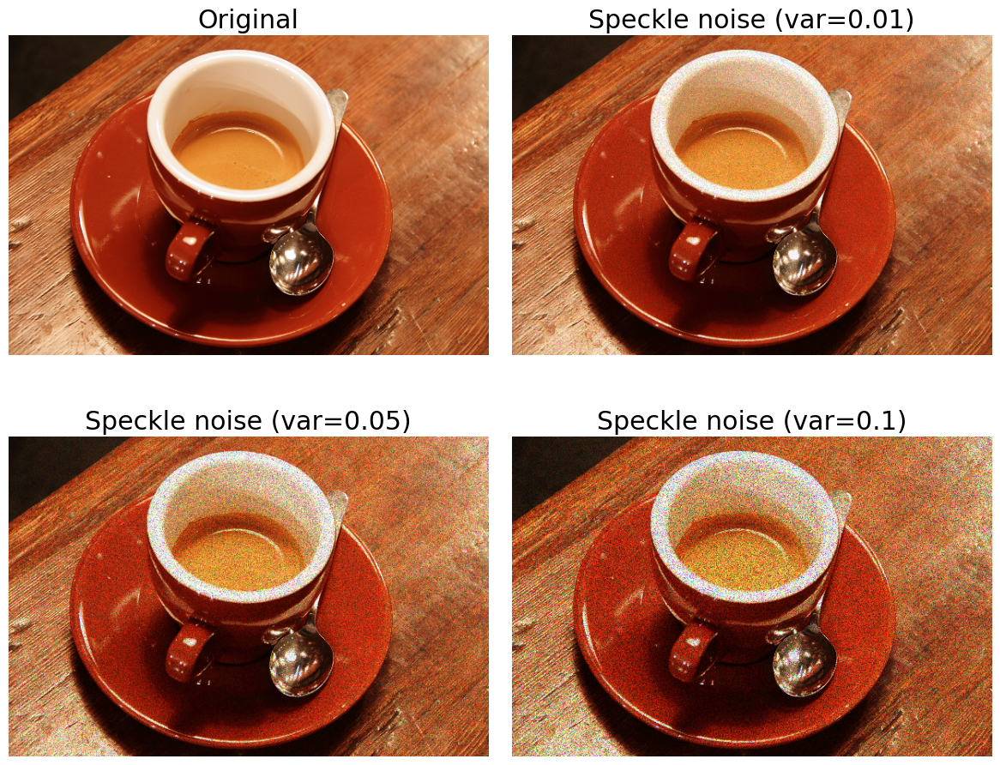

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise

# Load and normalize the image
original = img_as_float(data.coffee())

# Speckle noise intensity levels
speckle_variances = [0.01, 0.05, 0.1]

# Create 2x2 grid: Original + 3 noisy versions
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

# Plot original image
axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

# Generate and plot speckle noise images
for i, var in enumerate(speckle_variances):
    noisy = random_noise(original, mode='speckle', var=var)
    axes[i+1].imshow(noisy)
    axes[i+1].set_title(f'Speckle noise (var={var})')
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('coffee_speckle_2x2.png', dpi=150)
plt.show()


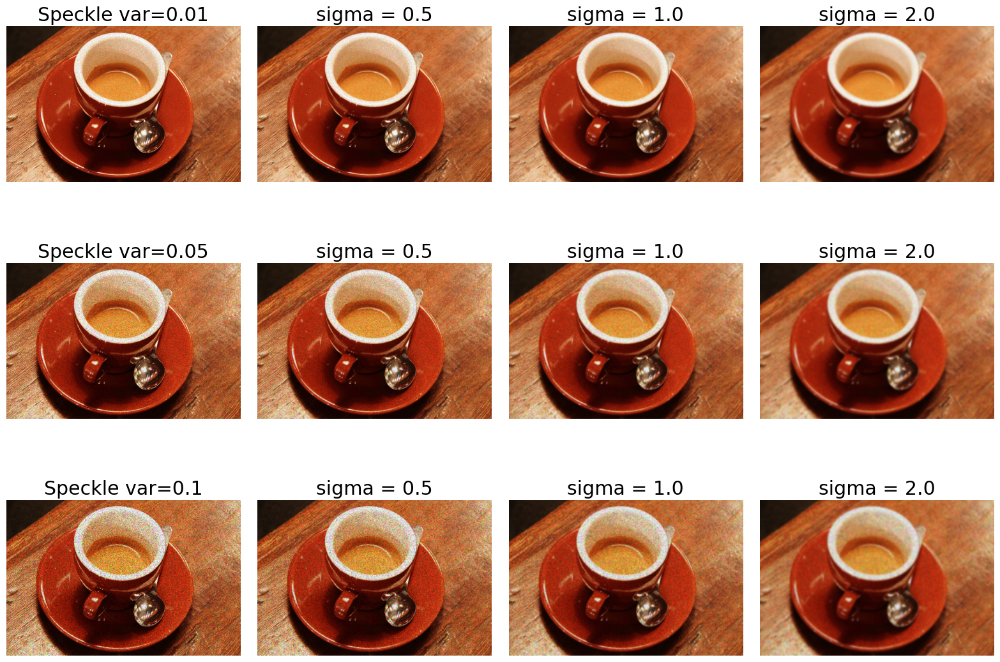

'\nAs the Gaussian sigma increases, the filter performs stronger smoothing:\n\nAt low sigma (0.5): fine details are preserved, only light denoising occurs.\n\nAt moderate sigma (1.0): better noise suppression, but slight blurring of edges.\n\nAt high sigma (2.0): strong smoothing removes much of the noise, but also blurs \ntextures and edges significantly.\n\nThe effect is more noticeable at higher noise levels, where larger sigma helps \nsuppress the more aggressive speckle noise, but at the cost of image detail.\n'

In [ ]:
#-Task 4: The standard deviation for Gaussian kernel affects the behavior of the gaussian filter
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.filters import gaussian

# Load image
original = img_as_float(data.coffee())

# Define speckle noise variances and Gaussian sigma values
speckle_variances = [0.01, 0.05, 0.1]
sigmas = [0.5, 1.0, 2.0]

# Create subplot: 3 rows (one per noise level), 4 columns (noisy + 3 filters)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 12))

for row, var in enumerate(speckle_variances):
    # Generate noisy image
    noisy = random_noise(original, mode='speckle', var=var)

    # Plot original noisy image
    axes[row, 0].imshow(noisy)
    axes[row, 0].set_title(f'Speckle var={var}')
    axes[row, 0].axis('off')

    # Apply Gaussian filter with different sigma values
    for col, sigma in enumerate(sigmas):
        filtered = gaussian(noisy, sigma=sigma, channel_axis=-1)
        axes[row, col+1].imshow(filtered)
        axes[row, col+1].set_title(f'sigma = {sigma}')
        axes[row, col+1].axis('off')

plt.tight_layout()
plt.savefig('gaussian_filter_effects.png', dpi=150)
plt.show()

"""As the Gaussian sigma increases, the filter performs stronger smoothing:

At low sigma (0.5): fine details are preserved, only light denoising occurs.

At moderate sigma (1.0): better noise suppression, but slight blurring of edges.

At high sigma (2.0): strong smoothing removes much of the noise, but also blurs
textures and edges significantly.

The effect is more noticeable at higher noise levels, where larger sigma helps
suppress the more aggressive speckle noise, but at the cost of image detail.
"""



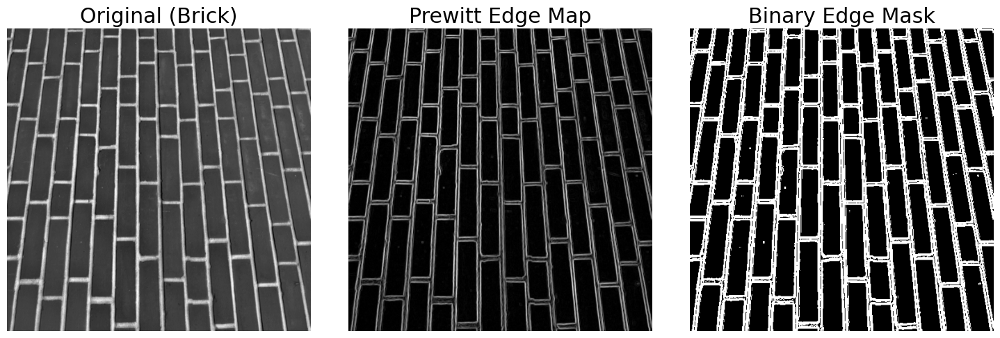

Fraction of image that is edges: 0.2870
Fraction of image that is non-edges (brick): 0.7130


In [ ]:
#Task 5: Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter.

from skimage import data, filters
import matplotlib.pyplot as plt
import numpy as np

# 1. Load the 'brick' image (already grayscale)
image = data.brick()

# 2. Apply Prewitt edge filter directly
edges = filters.prewitt(image)

# 3. Threshold to create binary edge map
threshold = np.mean(edges)
binary_edges = edges > threshold

# 4. Quantify fractions
total_pixels = binary_edges.size
edge_pixels = np.count_nonzero(binary_edges)
edge_fraction = edge_pixels / total_pixels
non_edge_fraction = 1 - edge_fraction

# 5. Plot results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original (Brick)')
axes[0].axis('off')

axes[1].imshow(edges, cmap='gray')
axes[1].set_title('Prewitt Edge Map')
axes[1].axis('off')

axes[2].imshow(binary_edges, cmap='gray')
axes[2].set_title('Binary Edge Mask')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# 6. Print results
print(f"Fraction of image that is edges: {edge_fraction:.4f}")
print(f"Fraction of image that is non-edges (brick): {non_edge_fraction:.4f}")


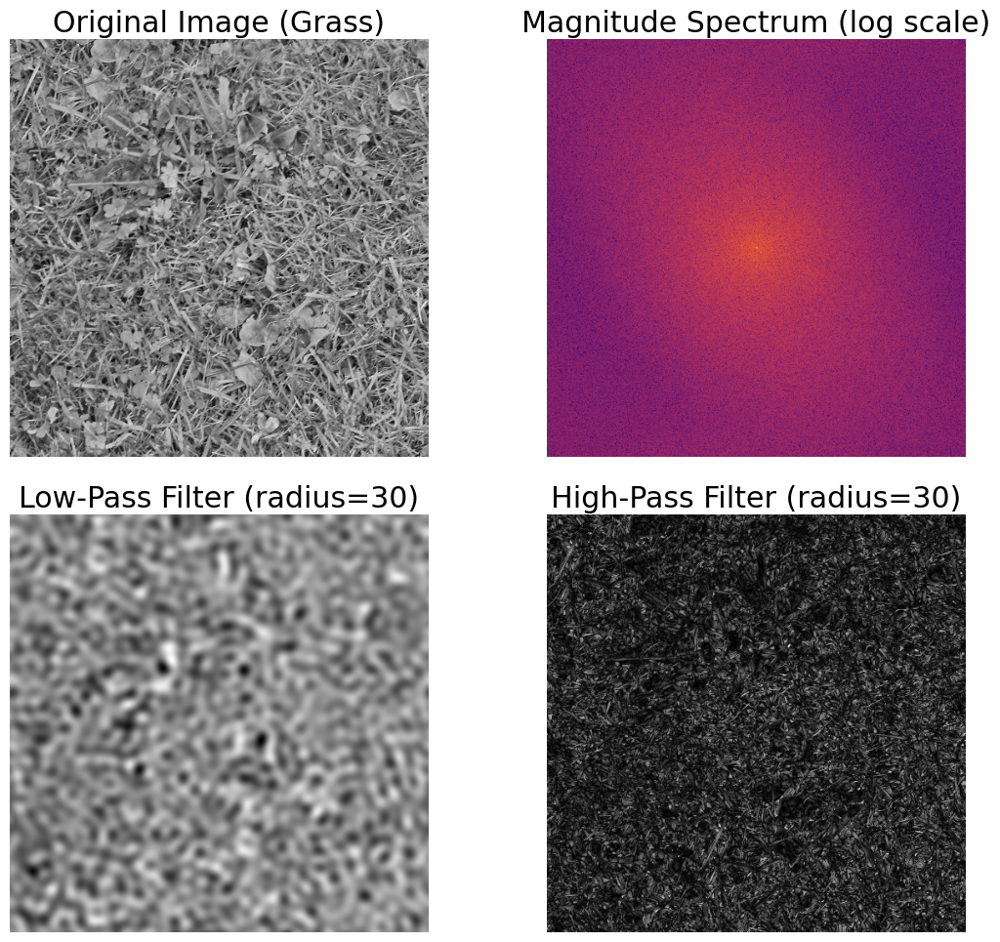

'\nDiscussion / What to observe\nLow-pass filter:\n\nKeeps the low-frequency components (center of the Fourier spectrum).\n\nResult: smooths the image, blurring fine textures but preserving large-scale structures.\n\nCorresponds to slow spatial variations in the image (like large patches of similar color).\n\nHigh-pass filter:\n\nKeeps the high-frequency components (edges and fine details).\n\nResult: emphasizes edges, textures, and noise, removing smooth regions.\n\nCorresponds to rapid spatial changes, like sharp edges or fine texture details (grass blades).\n'

In [ ]:
#- Task 6: Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
from numpy.fft import fft2, ifft2, fftshift, ifftshift

# 1. Load grass image and convert to grayscale
img = data.grass()
if img.ndim == 3:
    img_gray = color.rgb2gray(img)
else:
    img_gray = img

# 2. Fourier transform and shift zero frequency to center
F = fft2(img_gray)
F_shifted = fftshift(F)

# 3. Create filter masks
rows, cols = img_gray.shape
crow, ccol = rows // 2, cols // 2

# Radius of the low-pass filter (adjust to keep more/less low frequencies)
radius = 30

# Create circular low-pass filter mask (1 inside radius, 0 outside)
Y, X = np.ogrid[:rows, :cols]
distance = np.sqrt((X - ccol)**2 + (Y - crow)**2)

low_pass_mask = distance <= radius
high_pass_mask = distance > radius

# 4. Apply masks
F_low = F_shifted * low_pass_mask
F_high = F_shifted * high_pass_mask

# 5. Inverse FFT to get filtered images
img_low = np.abs(ifft2(ifftshift(F_low)))
img_high = np.abs(ifft2(ifftshift(F_high)))

# 6. Visualize results
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title('Original Image (Grass)')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.log1p(np.abs(F_shifted)), cmap='inferno')
axes[0, 1].set_title('Magnitude Spectrum (log scale)')
axes[0, 1].axis('off')

axes[1, 0].imshow(img_low, cmap='gray')
axes[1, 0].set_title(f'Low-Pass Filter (radius={radius})')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_high, cmap='gray')
axes[1, 1].set_title(f'High-Pass Filter (radius={radius})')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

"""
Discussion / What to observe
Low-pass filter:

Keeps the low-frequency components (center of the Fourier spectrum).

Result: smooths the image, blurring fine textures but preserving large-scale structures.

Corresponds to slow spatial variations in the image (like large patches of similar color).

High-pass filter:

Keeps the high-frequency components (edges and fine details).

Result: emphasizes edges, textures, and noise, removing smooth regions.

Corresponds to rapid spatial changes, like sharp edges or fine texture details (grass blades).
"""


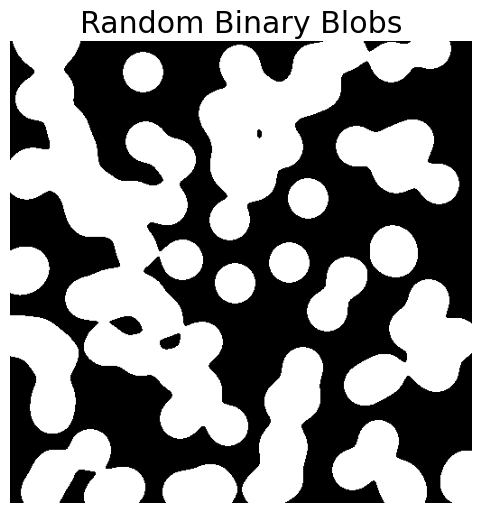

In [ ]:
#Task 7: Use the function binary_blobs to generate an image with random blobs:

import matplotlib.pyplot as plt
from skimage import data

# Generate binary blobs image
blobs = data.binary_blobs(length=512, blob_size_fraction=0.1, n_dim=2,
                          volume_fraction=0.5, rng=None)

# Show the blobs image
plt.figure(figsize=(6, 6))
plt.imshow(blobs, cmap='gray')
plt.title('Random Binary Blobs')
plt.axis('off')
plt.show()


In [ ]:
#How many consecutive morphological erosions are needed in order to remove all the blobs?
#Use a disk-shaped structuring element of radius 3 pixels (footprint)

import numpy as np
import matplotlib.pyplot as plt
from skimage import data, morphology

# 1. Generate the binary blobs image
blobs = data.binary_blobs(length=512, blob_size_fraction=0.1,
                          n_dim=2, volume_fraction=0.5, rng=None)

# 2. Create disk-shaped structuring element of radius 3
selem = morphology.disk(3)

# 3. Apply erosions repeatedly until no blobs remain
eroded = blobs.copy()
iterations = 0

while eroded.any():
    eroded = morphology.erosion(eroded, selem)
    iterations += 1

print(f"Number of consecutive erosions to remove all blobs: {iterations}")

""""
What this does:
Starts with the original blobs.

Erodes with disk-shaped structuring element radius=3 pixels.

Counts iterations until the image is fully cleared (all False).

Prints the count.



Is it normal that the Number of consecutive erosions to remove all blobs changes each iteratio?

Yes, that’s normal if you don’t fix the random seed (rng) when generating the blobs!

Why?
data.binary_blobs() generates a random pattern each time you run it unless you specify a seed.

So every time you run your code, the blobs are different in size and shape.

This causes the number of erosions needed to remove all blobs to vary.
"""

Number of consecutive erosions to remove all blobs: 19


'"\nWhat this does:\nStarts with the original blobs.\n\nErodes with disk-shaped structuring element radius=3 pixels.\n\nCounts iterations until the image is fully cleared (all False).\n\nPrints the count.\n\n\n\nIs it normal that the Number of consecutive erosions to remove all blobs changes each iteratio?\n\nYes, that’s normal if you don’t fix the random seed (rng) when generating the blobs!\n\nWhy?\ndata.binary_blobs() generates a random pattern each time you run it unless you specify a seed.\n\nSo every time you run your code, the blobs are different in size and shape.\n\nThis causes the number of erosions needed to remove all blobs to vary.\n'